# IFT 6758 - Assignment 2

In [13]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Question 1

### a)
Begin by using the functions created in `q1.py` to make the data more informative and readable. Specifically, complete the following cells:


In [1]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
from q1 import count_labels, convert_id, convert_ids, contains_label, get_correlation

sns.set(style="ticks")

In [2]:
# Load the `audio_segments.csv` into a DataFrame `df`
df = pd.read_csv("./data/audio_segments.csv") 
print(df)

            # YTID   start_seconds   end_seconds  \
0      --4gqARaEJE             0.0          10.0   
1      --BfvyPmVMo            20.0          30.0   
2      --U7joUcTCo             0.0          10.0   
3      --i-y1v8Hy8             0.0           9.0   
4      -0BIyqJj9ZU            30.0          40.0   
...            ...             ...           ...   
20366  zyF8TGSRvns           150.0         160.0   
20367  zz35Va7tYmA            30.0          40.0   
20368  zzD_oVgzKMc            30.0          40.0   
20369  zzNdwF40ID8            70.0          80.0   
20370  zzbTaK7CXJY            30.0          40.0   

                               positive_labels  
0        /m/068hy,/m/07q6cd_,/m/0bt9lr,/m/0jbk  
1                                     /m/03l9g  
2                                    /m/01b_21  
3      /m/04rlf,/m/09x0r,/t/dd00004,/t/dd00005  
4             /m/07rgt08,/m/07sq110,/t/dd00001  
...                                        ...  
20366   /m/0dwsp,/m/0dwtp,/m/0f8

In [3]:
# Add a column corresponding to the count of labels called `label_count`
# Here, there is an annoying issue with accessing the positive_labels column

df['label_count'] = df[' positive_labels'].apply(count_labels)

In [5]:
# Add a new column called `label_names` with the processed human readable label names instead of label IDS

# Print the time taken for this operation (either using the time module or timeit). 
# Since we are only executing this code once it is relatively fine that it takes a couple of minutes. 
# However, for a larger dataset, it would be worth the time to speed it up 
# (for example by creating a ID -> name dictionary once and using that).


id_to_name = {}
def convert_ids_optimized(ids: str) -> str:
    global id_to_name
    ids_list = ids.split(',')
    names = []
    # voir si chaque ID et utiliser le dictionnaire pour récupérer ou convertir les noms
    for id in ids_list:
        if id not in id_to_name:
            id_to_name[id] = convert_id(id)
        names.append(id_to_name[id])
    return '|'.join(names)
start_time = time.process_time()
df['label_names'] = df[' positive_labels'].apply(convert_ids_optimized)
print("Temps écoulé :", time.process_time() - start_time, "seconds")


Temps écoulé : 1.0939516999999999 seconds


In [6]:
# Display the DataFrame and save it to `audio_segments_clean.csv` (without index)

print(df)
df.to_csv("./data/audio_segments_clean.csv",index=False)
df.to_csv("./audio_segments_clean.csv",index=False)

            # YTID   start_seconds   end_seconds  \
0      --4gqARaEJE             0.0          10.0   
1      --BfvyPmVMo            20.0          30.0   
2      --U7joUcTCo             0.0          10.0   
3      --i-y1v8Hy8             0.0           9.0   
4      -0BIyqJj9ZU            30.0          40.0   
...            ...             ...           ...   
20366  zyF8TGSRvns           150.0         160.0   
20367  zz35Va7tYmA            30.0          40.0   
20368  zzD_oVgzKMc            30.0          40.0   
20369  zzNdwF40ID8            70.0          80.0   
20370  zzbTaK7CXJY            30.0          40.0   

                               positive_labels  label_count  \
0        /m/068hy,/m/07q6cd_,/m/0bt9lr,/m/0jbk            4   
1                                     /m/03l9g            1   
2                                    /m/01b_21            1   
3      /m/04rlf,/m/09x0r,/t/dd00004,/t/dd00005            4   
4             /m/07rgt08,/m/07sq110,/t/dd00001            3 

### b)

Next, using the clean DataFrame, complete the following cells to better understand the distribution of labels in the dataset. For each plot below, make sure to include appropriate **axis names** and a **title**.

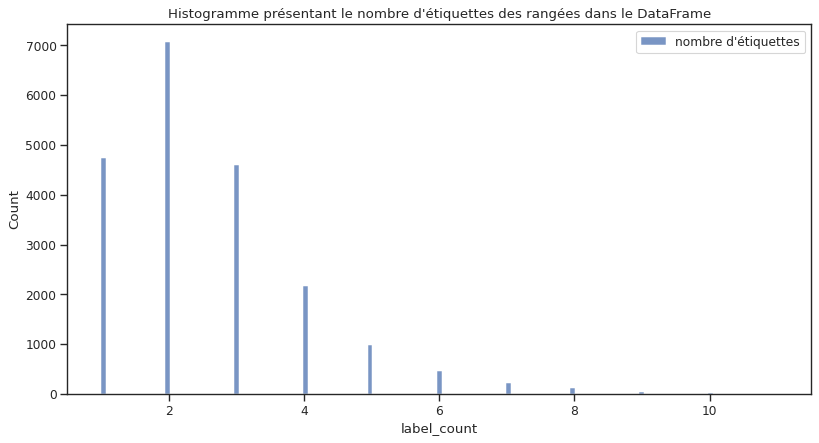

In [7]:
# Using seaborn, create a histogram of the label count of the rows in the DataFrame

plt.figure(figsize=(12, 6), dpi=80)
sns.histplot(data=df, x="label_count", label = 'nombre d\'étiquettes')
plt.title("Histogramme présentant le nombre d'étiquettes des rangées dans le DataFrame")
plt.legend()
plt.show()

Follow the steps below to create a heatmap showing "correlation" between different labels. 
- Specifically, each cell of the heatmap should correspond to the probability that a sample with the corresponding row label also has the corresponding column label. 
- Just consider the labels ["Piano", "Classical music", "Speech", "Conversation", "Screaming"]. 

Your final plot should look something like this:

![alt text](images/heatmap.png "Heatmap")

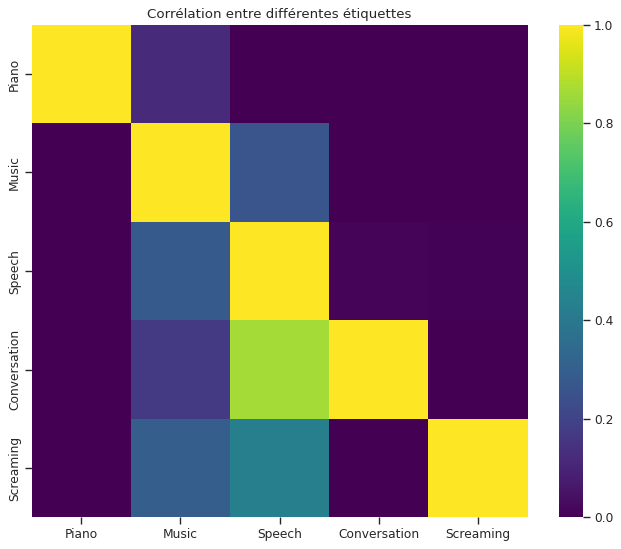

In [8]:
labels = ["Piano", "Music", "Speech", "Conversation", "Screaming"]

# There are a couple ways to approach this, the way we recommend here is to first build a 2D grid where each
# value is the correlation value between the corresponding row/column using the functions created in q1.py.

n_class = len(labels)
conf_grid2D = np.zeros((n_class,n_class))
for i in range(n_class):
    for j in range(n_class):
        conf_grid2D[i,j] += get_correlation(df['label_names'], labels[i], labels[j])
        
# Then using sns.heatmap, create the heatmap, taking advantage of xticklabels and yticklabels to set the label names
# as tick values

plt.figure(figsize=(10, 8), dpi=80)
sns.heatmap(conf_grid2D, cmap="viridis", xticklabels=labels, yticklabels=labels)
plt.title("Corrélation entre différentes étiquettes")
plt.show()

## Question 2
Question 2 has no notebook component, just fill out the `q2.py` file.

## Question 3

Download the audio for the following labels using the function created in `q3.py`

In [21]:
from q3 import data_pipeline, rename_files, filter_df

In [22]:
# Download "Cough"

# TODO

# Rename to include the start/end times

# TODO

In [23]:
# Download "Hammer"

# TODO

# Rename to include the start/end times

# TODO

As you've probably noticed, downloading all this audio data is slow (and as such we only required you to download 2 of the labels). In many cases, it is possible to get significant performance increases by using either multiprocessing (https://docs.python.org/3/library/multiprocessing.html) or multithreading (https://docs.python.org/3/library/threading.html) which could for example allow you to download multiple audio files in parallel. 

As a good rule of thumb, use multithreading when your programs is IO-bound (for example here) and multiprocessing when it is CPU-bound (and thus make use of all the cores of your CPU)

## Question 4
For the following cells, use the ID "0GNNFBrRz1E". Complete the functions and run the cells provided below.

In [9]:
import librosa

In [11]:
# Play the audio segment in Jupyter using 
# https://ipython.org/ipython-doc/dev/api/generated/IPython.display.html#IPython.display.Audio
from IPython.display import Audio
Audio(filename='Hammer_cut/0GNNFBrRz1E.mp3')

One way to visualize audio is through the use of mel-spectrograms. At a very high level, Mel-spectrograms convert audio to a 2D image through the use of the Fourier transform (more details can be found here: https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53)

In [12]:
stft_hopsize = 128
n_fft = 512
sample_rate = 16000

def to_log_scale(mel: np.ndarray) -> np.ndarray:
    mel = np.log(mel + 1e-6)/2.0
    return mel

def create_mel_spectrogram(mp3_path: str) -> np.ndarray:
    """ 
    Using librosa (https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html) write a function
    that:
    1. Loads in audio from a mp3_path (using librosa)
    2. Converts it to a mel-spectrogram (using the parameters provided above)
    3. Applies the logscale transformation to the mel-spectrogram (provided above once again)
    4. Returns the transformed mel-spectrogram
    
    Make sure to pass the correct sample rate
    """

    y, sr = librosa.load(path = mp3_path)
    mel = librosa.feature.melspectrogram(y=y, sr = sample_rate, n_fft = n_fft, hop_length = stft_hopsize)
    mel_log = to_log_scale(mel)
    return mel_log 

create_mel_spectrogram("Hammer_cut/0GNNFBrRz1E.mp3")

/tmp/ipykernel_2160/2586083265.py:21: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(path = mp3_path)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/home/mohamed/miniconda/envs/myenv/lib/python3.8/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


array([[-6.9077554, -6.9077554, -6.9077554, ..., -6.9077554, -6.9077554,
        -6.9077554],
       [-6.9077554, -6.9077554, -6.9077554, ..., -6.9077554, -6.9077554,
        -6.9077554],
       [-6.9077554, -6.9077554, -6.9077554, ..., -6.9077554, -6.9077554,
        -6.9077554],
       ...,
       [-6.9077554, -6.9077554, -6.9077554, ..., -6.9077554, -6.9077554,
        -6.9077554],
       [-6.9077554, -6.9077554, -6.9077554, ..., -6.9077554, -6.9077554,
        -6.9077554],
       [-6.9077554, -6.9077554, -6.9077554, ..., -6.9077554, -6.9077554,
        -6.9077554]], dtype=float32)

Audio data can also be visualized by looking at the waveform (i.e. as a line plot of the amplitude values). We will combine both visualizations methods below. The resulting plot should look something like:
![alt text](images/combined_plot.png "Combined Plot")

[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/tmp/ipykernel_2160/1652903292.py:14: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(path = mp3_path)
/home/mohamed/miniconda/envs/myenv/lib/python3.8/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
/tmp/ipykernel_2160/2586083265.py:21: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(path = mp3_path)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/home/mohamed/miniconda/envs/myenv/lib/python3.8/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in li

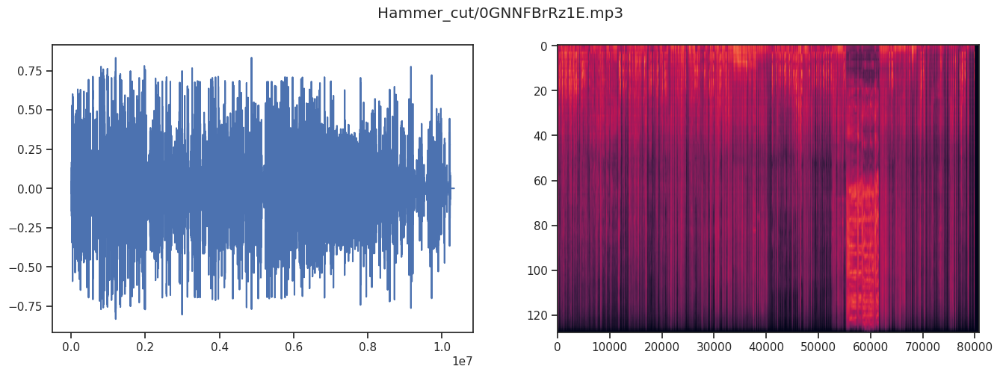

In [13]:
def plot_audio(mp3_path: str) -> None:
    """ 
    Using matplotlib and create_mel_spectrogram() write a function that takes a mp3_path and plots
    both the waveform (line plot of amplitudes) and the mel-spectrogram side-by-side as subplots.
    
    Use the path as a single main title for both subplots
    """

    fig = plt.figure(figsize=(16, 5))
    ax_graph = fig.add_subplot(121)
    ax_mel = fig.add_subplot(122)

    fig.suptitle(mp3_path)
    y, sr = librosa.load(path = mp3_path)
    ax_graph.plot(y)
    mel_log = create_mel_spectrogram("Hammer_cut/0GNNFBrRz1E.mp3")
    ax_mel.imshow(mel_log, aspect='auto')
    plt.show()
    

plot_audio("Hammer_cut/0GNNFBrRz1E.mp3")